# Analysis of fluorescent microplastic particles

In this Jupyter Notebook you can find all relevant spectral analysis of the recorded spectra.

In [1]:
import numpy as np
import pandas as pd

from pathlib import Path

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.pipeline import Pipeline

from sklearn.metrics import silhouette_score, silhouette_samples, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold

from util import *
from plotting_util import *

color_dict = {
    'PP-pure': 'aqua', 
    'PP-yellow/green': 'greenyellow',
    'PP-yellow': 'yellow',
    'PP-green': 'chartreuse',
    'PP-orange': 'darkorange',
    'PP-pink': 'deeppink'
}
sorting_order = list(color_dict.keys())

markers = ["v", "o", "^", "P", "s", "D",  "X", "*"]
marker_dict = {cls: markers[i % len(markers)] for i, cls in enumerate(color_dict.keys())}
_marker_map = {'s':'square', 'o':'circle', '^':'triangle-up', 'D':'diamond','v':'triangle-down','P':'pentagon','X':'x','*':'star'}
symbol_map = {cls: _marker_map.get(marker_dict.get(cls, 'o'), 'circle') for cls in color_dict.keys()}

markersize = 10
alpha_pts = 0.85

jitter_strength = 0.25  
random_state = 40
rng = np.random.default_rng(random_state)

data_path = Path.cwd() / "data/spectral_data"

wavelengths = np.load(data_path / "wavelengths.npy", allow_pickle=True)

In [2]:
laser_end = 460     # Startwavelength for peak search in spectra

sample_list = ['PP-yellow', 'PP-green', 'PP-orange', 'PP-pink'] # Sample choice --- EDIT ---
#sample_list = 'all'

if sample_list == 'all':
    sample_list = list(color_dict.keys())                        # List of sample names  

# Wavelength indices for intensity ratios
I0 = np.argwhere(wavelengths >= 471.7863)[0][0]
I1 = np.argwhere(wavelengths >= 589.7498)[0][0]

In [3]:
spectra_dict_1 = np.load(data_path / "spectra_peaks_dict_1.npy", allow_pickle=True).item()
spectra_df_1 = df_from_dict(spectra_dict_1, normalize=False, classes=sample_list)
spectra_df_1_normed = df_from_dict(spectra_dict_1, normalize=True, classes=sample_list)

spectra_dict_2 = np.load(data_path / "spectra_peaks_dict_2.npy", allow_pickle=True).item()
spectra_df_2 = df_from_dict(spectra_dict_2, normalize=False, classes=sample_list)
spectra_df_2_normed = df_from_dict(spectra_dict_2, normalize=True, classes=sample_list)

spectra_dict_3 = np.load(data_path / "spectra_peaks_dict_3.npy", allow_pickle=True).item()
spectra_df_3 = df_from_dict(spectra_dict_3, normalize=False, classes=sample_list)
spectra_df_3_normed = df_from_dict(spectra_dict_3, normalize=True, classes=sample_list)

X = pd.concat([spectra_df_1, spectra_df_2])
y = X.index.get_level_values('class')

sample_keys = X.index.get_level_values('sample_key')

class_count = y.value_counts().to_dict()
display(class_count)

X_minmax = pd.DataFrame(min_max_norm(X, wavelengths, laser_end), index=X.index, columns=X.columns)

X_train = pd.concat([spectra_df_1_normed, spectra_df_2_normed])
X_train = X_train.rename(index={'PP-green': 'PP-yellow/green'}, level='class')
X_train = X_train.rename(index={'PP-yellow': 'PP-yellow/green'}, level='class')
y_train = X_train.index.get_level_values('class')

classes = y_train.unique().tolist()

X_test = spectra_df_3_normed.copy()
X_test = X_test.rename(index={'PP-green': 'PP-yellow/green'}, level='class')
X_test = X_test.rename(index={'PP-yellow': 'PP-yellow/green'}, level='class')
y_test = X_test.index.get_level_values('class')

X_train_minmax = min_max_norm(X_train, wavelengths, laser_end)
X_train_trans = intensity_ratio_transform(X_train_minmax, I0, I1)
X_train_df_trans = pd.DataFrame(X_train_trans, index=X_train.index, columns=['R1'])

X_test_minmax = min_max_norm(X_test, wavelengths, laser_end)
X_test_trans = intensity_ratio_transform(X_test_minmax, I0, I1)
X_test_df_trans = pd.DataFrame(X_test_trans, index=X_test.index, columns=['R1'])

{'PP-green': 60, 'PP-orange': 60, 'PP-pink': 60, 'PP-yellow': 60}

## Calculation of relevant spectral parameters

In [4]:
data_complete = {}
data_mean_std = {}

wavelengths_indices = np.argwhere(wavelengths > laser_end).flatten()
# list of classes actually present in X
classes_in_index = X.index.get_level_values('class').unique().tolist()

for cls in sample_list:
    if cls not in classes_in_index:
        print(f"Class '{cls}' not present in X — skipped.")
        continue

    idx = X.index.get_level_values('class') == cls
    spectra_class = X_minmax[idx]  # shape: (n_spectra, n_wavelengths)
    spectra_class = np.asarray(spectra_class)

    # find maxima (index and wavelength)
    max_indices = np.argmax(spectra_class[:, wavelengths_indices], axis=1)[:, None]  # shape: (n_spectra,)
    # indices refer to wavelengths_indices, convert back to full index:
    max_indices_full = wavelengths_indices[max_indices]
    lambda_max_array = wavelengths[max_indices_full]

    # mean and std of maximal wavelength
    lambda_max_mean, lambda_max_std = mean_and_std(lambda_max_array)

    spectra_class_X = np.asarray(X[idx])
    I_max_array = np.array([spectra_class_X[i, max_indices_full[i]] for i in range(len(max_indices_full))])
    I_max_mean, I_max_std = mean_and_std(I_max_array)

    # FWHM and bounds
    FWHM_array, left_half_max_array, right_half_max_array, FWHM_mean, FWHM_std, left_half_max_mean, left_half_max_std, right_half_max_mean, right_half_max_std = fwhm_and_bounds(
        wavelengths, spectra_class, max_indices_full
    )

    # save everything (optional)
    data_complete[cls] = {
        "λ_max (nm)": lambda_max_array,
        "FWHM (nm)": FWHM_array,
        "λ_left (nm)": left_half_max_array,
        "λ_right (nm)": right_half_max_array,
        "I_max (a.u.)": I_max_array,
    }
    data_mean_std[cls] = {
        "λ_max mean (nm)": lambda_max_mean,
        "λ_max std (nm)": lambda_max_std,
        "FWHM mean (nm)": FWHM_mean,
        "FWHM std (nm)": FWHM_std,
        "λ_left mean (nm)": left_half_max_mean,
        "λ_left std (nm)": left_half_max_std,
        "λ_right mean (nm)": right_half_max_mean,
        "λ_right std (nm)": right_half_max_std,
        "I_max mean (a.u.)": I_max_mean,
        "I_max std (a.u.)": I_max_std,
    }

df_data_mean_std = pd.DataFrame.from_dict(data_mean_std, orient='index')
df_data_complete = pd.DataFrame.from_dict(data_complete, orient='index')

pd.set_option('display.precision', 1)
display(df_data_mean_std)

,λ_max mean (nm),λ_max std (nm),FWHM mean (nm),FWHM std (nm),λ_left mean (nm),λ_left std (nm),λ_right mean (nm),λ_right std (nm),I_max mean (a.u.),I_max std (a.u.)
PP-yellow,499.6,1.0,58.0,0.9,482.6,0.9,540.6,1.2,7076.0,5168.5
PP-green,501.0,4.0,57.3,4.8,480.7,1.3,538.1,4.5,1131.2,851.5
PP-orange,584.2,0.7,39.5,0.3,567.8,0.4,607.3,0.4,14035.2,11470.3
PP-pink,589.8,1.5,38.3,1.3,573.6,1.0,611.9,0.7,989.3,558.4


## Spectra of different polypropylene samples

In [5]:
plot_spectra_by_class(X_minmax, wavelengths, color_dict, sorting_order=sorting_order)

In [6]:
parameters = [
    "λ_max (nm)",
    "FWHM (nm)",
    "λ_left (nm)",
    "λ_right (nm)",
    "I_max (a.u.)"
]

plot_box_parameters(df_data_complete, parameters)

## Clustering via intensity ratio

In [7]:
scatter_plot_1d(X_train_df_trans, dim_1='R1', marker_map=_marker_map, marker_dict=marker_dict, color_dict=color_dict, jitter_strength=jitter_strength, random_state=random_state, markersize=markersize, alpha_pts=alpha_pts, x_log=True, sorting_order=sorting_order)

### Silhouette score for clustering via intensity ratios

In [8]:
# Silhouette for R1 (Train)
X_feat_train = X_train_df_trans[['R1']].values
labels_train = X_train_df_trans.index.get_level_values('class').to_numpy()

# Count samples per class and select classes with >= 2 samples
counts = pd.Series(labels_train).value_counts()
valid = counts[counts >= 2].index  # only classes with ≥2 samples

# Need at least 2 classes for silhouette score
if len(valid) < 2:
    print("Not enough classes with >=2 samples in the training set for silhouette (requires >=2 classes).")
else:
    # Filter data to valid classes
    mask = np.isin(labels_train, valid)
    Xv, yv = X_feat_train[mask], labels_train[mask]

    # Compute silhouette values for each sample
    sil = silhouette_samples(Xv, yv, metric='euclidean')

    # Compute mean silhouette per class
    means = (
        pd.DataFrame({'class': yv, 'silhouette': sil})
        .groupby('class', observed=True)['silhouette']
        .mean()
        .reindex(valid)
    )

    # Compute overall silhouette score and assemble result
    overall = silhouette_score(Xv, yv, metric='euclidean')
    res = pd.concat([means, pd.Series({'Overall': overall})]).reset_index()
    res.columns = ['class', 'silhouette']

    # Display with 3 decimal precision
    pd.set_option('display.precision', 3)
    display(res)

,class,silhouette
0,PP-yellow/green,0.972
1,PP-orange,0.607
2,PP-pink,0.614
3,Overall,0.791


## Numerical Dimensionality Reduction

In [9]:
pca_components = 17
lda_components = 2
print(f"Number of PCA components: {pca_components}, Number of LDA components: {lda_components}")

# Define classifier
clf = KNeighborsClassifier(n_neighbors=5, metric='euclidean', weights='distance')

pca_lda = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=pca_components)),
    ('lda', LDA(n_components=lda_components)),
])

Number of PCA components: 17, Number of LDA components: 2


In [10]:
# Apply PCA-LDA transformation to train data
pca_lda.fit(X_train, y_train)
X_train_trans_pca = pca_lda.transform(X_train)
X_train_df_pca = pd.DataFrame(X_train_trans_pca, index=X_train.index, columns=[f'LD{i+1}' for i in range(lda_components)])

# Apply PCA-LDA transformation to test data
X_test_trans_pca = pca_lda.transform(X_test)
X_test_df_pca = pd.DataFrame(X_test_trans_pca, index=X_test.index, columns=[f'LD{i+1}' for i in range(lda_components)])

scatter_plot(X_train_df_pca, 'LD1', 'LD2', symbol_map, color_dict, markersize=markersize, alpha=alpha_pts)

### LDA explained variance ratio

In [11]:
# Plot LDA explained variance
evr=pca_lda.named_steps['lda'].explained_variance_ratio_

print(f"LDA explained variance using LD1 and LD2: {np.round(evr[0] + evr[1], 6)}")
if evr is None:
    raise AttributeError("LDA has no explained_variance_ratio_. Ensure solver='svd' and that lda is fitted.")

plot_lda_explained_variance(evr)

LDA explained variance using LD1 and LD2: 1.0


### Silhouette score for combined PCA and LDA

In [12]:
ld_cols = [c for c in X_train_df_pca.columns if c.startswith("LD")][:2]
X_ld = X_train_df_pca[ld_cols].values
labels = X_train_df_pca.index.get_level_values('class').to_numpy()

order = list(pd.unique(labels))

sil_samples = silhouette_samples(X_ld, labels, metric='euclidean')
overall = silhouette_score(X_ld, labels, metric='euclidean')

means = (pd.Series(sil_samples, index=labels)
         .groupby(level=0, observed=True)
         .mean()
         .reindex(order)
         .reset_index(name='silhouette'))

means.loc[len(means)] = ['Overall', overall]
pd.set_option('display.precision', 3)
display(means)

,index,silhouette
0,PP-yellow/green,0.800
1,PP-orange,0.801
2,PP-pink,0.841
3,Overall,0.810


## Classification
- Measurement series 1 & 2 for Training -> 'PP-yellow/green': 120, 'PP-orange': 60, 'PP-pink': 60
- Measurement series 3 for Testing -> 'PP-yellow/green': 60, 'PP-orange': 30, 'PP-pink': 30

In [13]:
# Define classifier
clf = KNeighborsClassifier(n_neighbors=5, metric='euclidean', weights='distance')

,Score
Accuracy,1.0
Precision (macro),1.0
Recall (macro),1.0
F1 (macro),1.0
"ROC-AUC (ovr, micro)",1.0


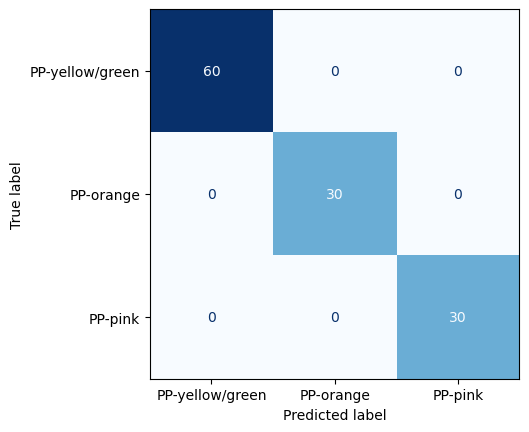

In [14]:
scatter_plot_train_test_1d(X_train_df_trans, X_test_df_trans, dim_1='R1', marker_map=_marker_map, marker_dict=marker_dict, color_dict=color_dict, jitter_strength=jitter_strength, random_state=random_state, markersize=markersize, alpha_pts=alpha_pts, x_log=True)

metrics_df, pred, probs = evaluate_classifier(clf, X_train_df_trans, X_test_df_trans, y_train, y_test, classes, plot=True)
display(metrics_df)

,Score
Accuracy,1.0
Precision (macro),1.0
Recall (macro),1.0
F1 (macro),1.0
"ROC-AUC (ovr, micro)",1.0


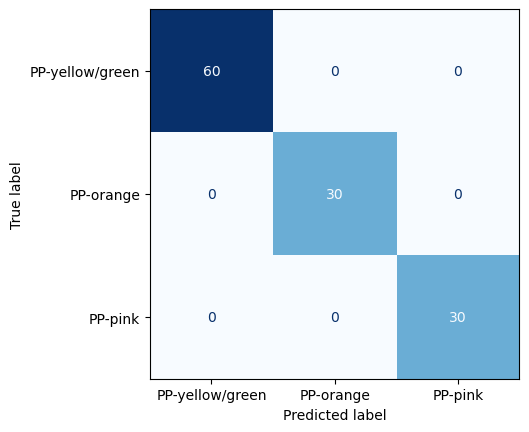

In [15]:
scatter_plot_train_test(X_train_df_pca, X_test_df_pca, dim_1='LD1', dim_2='LD2', symbol_map=symbol_map, color_dict=color_dict, markersize=markersize)

# Evaluate classifier
metrics_df, pred, probs = evaluate_classifier(clf, X_train_df_pca, X_test_df_pca, y_train, y_test, classes, plot=True)
display(metrics_df)

## Crossvalidation
- Using all samples (Series 1, 2 & 3) -> 'PP-yellow/green': 180, 'PP-orange': 90, 'PP-pink': 90
- Stratified 10-Fold Crossvalidation

In [16]:
n_splits = 10
cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

X_cv = pd.concat([X_train, X_test])
y_cv = X_cv.index.get_level_values('class')

class_count = y_cv.value_counts().to_dict()

display(class_count)

{'PP-yellow/green': 180, 'PP-orange': 90, 'PP-pink': 90}

In [17]:
# --- Intensity-Ratio Cross-validation ---
metrics_df = pd.DataFrame()
missclassifications = np.zeros((len(classes), len(classes)), dtype=int)

for i, (train_idx, test_idx) in enumerate(cv.split(X_cv, y_cv)):
    X_train_cv, X_test_cv = X_cv.iloc[train_idx], X_cv.iloc[test_idx]
    y_train_cv, y_test_cv = y_cv[train_idx], y_cv[test_idx]

    # Apply Intensity Ratio transformation to train data
    X_train_minmax_cv = min_max_norm(X_train_cv, wavelengths, laser_end)
    X_train_trans_cv = intensity_ratio_transform(X_train_minmax_cv, I0, I1)
    X_train_df_cv = pd.DataFrame(X_train_trans_cv, index=X_train_cv.index, columns=['R1'])

    # Apply Intensity Ratio transformation to test data and make predictions
    X_test_minmax_cv = min_max_norm(X_test_cv, wavelengths, laser_end)
    X_test_trans_cv = intensity_ratio_transform(X_test_minmax_cv, I0, I1)
    X_test_df_cv = pd.DataFrame(X_test_trans_cv, index=X_test_cv.index, columns=['R1'])

    # Evaluate classifier
    metrics, pred, probs = evaluate_classifier(clf, X_train_df_cv, X_test_df_cv, y_train_cv, y_test_cv, classes)

    missclassifications += confusion_matrix(y_test_cv, pred, labels=classes) - np.diag(np.diag(confusion_matrix(y_test_cv, pred, labels=classes)))

    metrics_df = pd.concat([metrics_df, metrics], axis=1)

metrics_df.columns = [f'Fold {i+1}' for i in range(n_splits)]
metrics_df.insert(0, 'Mean', metrics_df.mean(axis=1))
display(metrics_df)
misclassified_df = pd.DataFrame(missclassifications, index=classes, columns=classes)
display(misclassified_df)

,Mean,Fold 1,Fold 2,Fold 3,Fold 4,Fold 5,Fold 6,Fold 7,Fold 8,Fold 9,Fold 10
Accuracy,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Precision (macro),1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Recall (macro),1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
F1 (macro),1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
"ROC-AUC (ovr, micro)",1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


,PP-yellow/green,PP-orange,PP-pink
PP-yellow/green,0,0,0
PP-orange,0,0,0
PP-pink,0,0,0


In [18]:
# --- Numerical Cross-validation ---
metrics_df = pd.DataFrame()
missclassifications = np.zeros((len(classes), len(classes)), dtype=int)

for i, (train_idx, test_idx) in enumerate(cv.split(X_cv, y_cv)):
    X_train_cv, X_test_cv = X_cv.iloc[train_idx], X_cv.iloc[test_idx]
    y_train_cv, y_test_cv = y_cv[train_idx], y_cv[test_idx]

    # Apply PCA-LDA transformation to train data
    pca_lda.fit(X_train_cv, y_train_cv)
    X_train_trans_cv = pca_lda.transform(X_train_cv)
    X_train_df_cv = pd.DataFrame(X_train_trans_cv, index=X_train_cv.index, columns=[f'LD{i+1}' for i in range(lda_components)])

    # Apply PCA-LDA transformation to test data
    X_test_trans_cv = pca_lda.transform(X_test_cv)
    X_test_df_cv = pd.DataFrame(X_test_trans_cv, index=X_test_cv.index, columns=[f'LD{i+1}' for i in range(lda_components)])

    # Evaluate classifier
    metrics, pred, probs = evaluate_classifier(clf, X_train_df_cv, X_test_df_cv, y_train_cv, y_test_cv, classes, plot=False)

    missclassifications += confusion_matrix(y_test_cv, pred, labels=classes) - np.diag(np.diag(confusion_matrix(y_test_cv, pred, labels=classes)))
    
    metrics_df = pd.concat([metrics_df, metrics], axis=1)

metrics_df.columns = [f'Fold {i+1}' for i in range(n_splits)]
metrics_df.insert(0, 'Mean', metrics_df.mean(axis=1))
display(metrics_df)
misclassified_df = pd.DataFrame(missclassifications, index=classes, columns=classes)
display(misclassified_df)

,Mean,Fold 1,Fold 2,Fold 3,Fold 4,Fold 5,Fold 6,Fold 7,Fold 8,Fold 9,Fold 10
Accuracy,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Precision (macro),1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Recall (macro),1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
F1 (macro),1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
"ROC-AUC (ovr, micro)",1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


,PP-yellow/green,PP-orange,PP-pink
PP-yellow/green,0,0,0
PP-orange,0,0,0
PP-pink,0,0,0
